# Проект: "Рынок заведений общественного питания Москвы"

## Загрузка и обзор данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import numpy as np
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
data=pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.columns

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats'],
      dtype='object')

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
data['name'].nunique()

5614

In [7]:
data['category'].nunique()

8

In [8]:
data['district'].nunique()

9

In [9]:
pd.DataFrame(round(data.isna().mean()*100,)
            ).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


In [10]:
data.duplicated().sum()

0

Вывод: В целом данные коректы. В таблице присутствуют 5614 заведений, 8 категорий и 9 районов. Наименования столбцов удобны для восприятия, а данные в стобцах привидены к соответствующим типам. Однако для дальнейшего анализа и добавления столбцов будет необходимо изменить некоторые типы данных. Обнаружено много пропусков. Это связано с тем, что  информация, могла быть добавлена пользователями или найдена в общедоступных источниках. Мы не можем их заполнить корректно, но и удалить их нельзя т.к. это сильно исказит анализ. Оставим пропуски в таблице. Явных дубликатов необнаружено.

## Предобработка данных

In [11]:
data['name'] = data['name'].astype(str)
data['name'] = data['name'].str.lower()

to_replace = (
    ('ё','е'),
    ('.',' '),
    ('-',' '),
    ('  ',' ')
)

for old, new in to_replace:
    if old == '.':
        data['name'] = data['name'].str.replace(old, new, regex=True)
    else:
        data['name'] = data['name'].str.replace(old, new)


list(data['name'].sort_values(ascending=True).unique())

['#кешбэккафе',
 '+39 pizzeria mozzarella bar',
 '1 этаж',
 '1 я креветочная',
 '10 идеальных пицц',
 '1001 ночь',
 '100ловая',
 '100лоффка',
 '13',
 '13 chef doner',
 '15 kitchen+bar',
 '15 й шар',
 '16 июня',
 '16 тонн',
 '18 грамм',
 '1901 comfort food zone',
 '1у',
 '2 й этаж',
 '2 типа',
 '2046',
 '21 век',
 '22 акра кофе&хлеб',
 '2u ту ю',
 '3 ступени',
 '351 bar',
 '4 2 bar',
 '4 сезона',
 '4/1 restaurant',
 '42 coffee shop',
 '47',
 '495',
 '4friends coffee',
 '4tuna cafe&grill',
 '5 stars coffee',
 '55 709201, 37 392257',
 '6 am bread kitchen',
 '6 рукопожатий',
 '69 раков',
 '7 сэндвичей',
 '7 элемент',
 '7/12',
 '8 oz',
 '8 вафель',
 '8 зерен',
 '8 пончиков',
 '800°с contemporary steak',
 '8bit pizza',
 '9 bar coffe',
 '9 bar coffee',
 '9 зерен',
 'a cafe',
 'abc coffee roasters',
 'acai family',
 'accent',
 "adam's chicken",
 'adria mare',
 'ahava',
 'air coffee',
 'al halal',
 'al33 пиццерия бар боттега',
 'all day',
 'alma',
 'alternative coffee',
 'aly’s poke',
 'amande'

In [12]:
data[data.duplicated(subset=['name','lat','lng'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


In [13]:
data=data.drop(index=1511).reset_index()

In [14]:
data['street'] = data['address'].str.split(', ').apply(lambda x: x[1])

```python
data['address'].str.split(', ').str[1]
```

In [15]:
data['hours']=data['hours'].astype(str)

In [16]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [17]:
data['chain']=data['chain'].astype(str)
data['chain']=data['chain'].str.replace('0', 'несетевое').str.replace('1', 'сетевое')

Вывод: В ходе предобработки столбца с названием, и дальнейшем поиском в нем неявных дубликатов, удалось найти одну дублирующуюся строчку в датасете, ее удаляем. 
Создан новый столбец с круглосуточной работой заведения и столбец с названием улицы. 
Столбец с обозначение сетевых мест переименован для удобства.

## Анализ данных

### Общие данные

#### Категории

In [18]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [19]:
category_cnt=data.groupby('category')['index'].count().reset_index()
category_cnt = category_cnt.sort_values(by='index',ascending=False)
category_cnt

,category,index
3,кафе,2378
6,ресторан,2042
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


Больше всего в Москве кафе, их 2378, далее идут рестораны, со значением 2042. Третье место занимают кофейни - 1413. Остальных категорий заметно меньше.

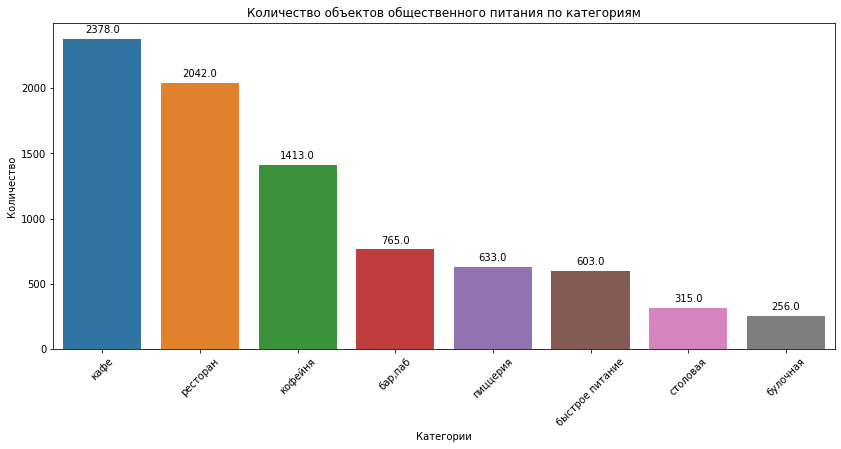

In [20]:
plt.figure(figsize = (14,6))

ax = sns.barplot(x='category', y='index', data=category_cnt, estimator=sum)

for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)
ax.set_title('Количество объектов общественного питания по категориям')
ax.set_xlabel('Категории')
ax.set_ylabel('Количество')

plt.show()

Абсолютные лидеры по количеству заведений это: кафе, рестораны и кофейни. Примерно на одном среднем уровне идут бары-пабы, быстрое питание и пиццерии. Меньше всего булочных и столовых.

#### Посадочные места

In [21]:
data['seats'].describe()

count    4794.000000
mean      108.405090
std       122.840831
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Максимальное значение посадочных мест - 1288. Похоже на ошибку в данных, проверим на выбросы.

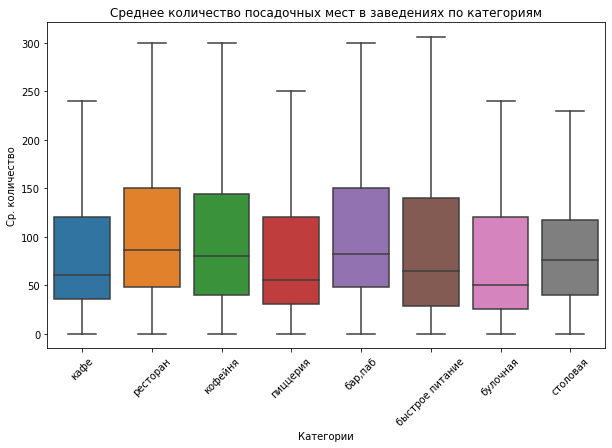

In [22]:
plt.figure(figsize = (10,6))
ax = sns.boxplot(x='category', y='seats', data=data, showfliers=False)

ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)
ax.set_title('Среднее количество посадочных мест в заведениях по категориям')
ax.set_xlabel('Категории')
ax.set_ylabel('Ср. количество')
plt.show()

По графику видно, что количество мест в заведении редко больше 300.

In [23]:
arr=data['seats'].dropna()
print(np.percentile(arr, [90, 95, 99]))

[240. 307. 625.]


По процентилям видно, что не более 10% заведений имеют количество мест больше 240, 5% не более 307 и 1% не более 625

In [24]:
data=data.query('(seats<=625) or (seats.isnull())')

Убирем заведения с числом мест более 625,так как их можно считать выбросами. Они не повлияют на исследование.

In [25]:
seats_cnt=data.groupby('category')['seats'].mean().sort_values().reset_index()
round(seats_cnt,2)

,category,seats
0,булочная,89.39
1,пиццерия,91.69
2,кафе,92.17
3,столовая,93.00
4,быстрое питание,96.19
5,кофейня,105.36
6,"бар,паб",112.31
7,ресторан,116.93


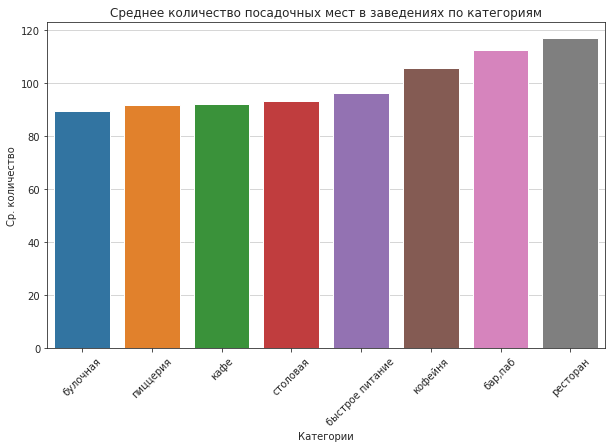

In [26]:
sns.set_style("ticks",{'axes.grid' : True})
plt.figure(figsize = (10,6))
ax = sns.barplot(x='category', y='seats', data=seats_cnt)

ax.set_xticklabels(ax.get_xticklabels(),rotation = 45, )
ax.set_title('Среднее количество посадочных мест в заведениях по категориям')
ax.set_xlabel('Категории')
ax.set_ylabel('Ср. количество')
plt.show()

Больше всего посадочных мест в ресторанах, барах и кофейнях. Количество мест в этих заведениях в среднем более 100. У остальных категорий примерно одинаковое количество мест, около 90.

#### Сетевые и несетевые заведения

In [27]:
seats = data.groupby('chain')['index'].count().reset_index()
seats.rename(columns = {'chain':'тип','index':'количество'})

,тип,количество
0,несетевое,5182
1,сетевое,3193


Сетевых заведений 5182, а несетевых 3193

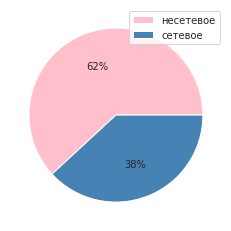

In [28]:
plt.pie(seats['index'], autopct='%1.0f%%', colors = ['pink', 'steelblue'])
plt.legend(labels = seats['chain'])
plt.show()

В процентном соотношении несетевых заведений 60% а сетевых 40%. Несетевых больше на 20%

In [29]:
category_cnt_chain = data.pivot_table(index='category', values='index',
                                      columns='chain',aggfunc='count').reset_index()
category_cnt_chain.columns.name=''
category_cnt_chain.sort_values(by='несетевое',ascending=False)

,category,несетевое,сетевое
3,кафе,1593,777
6,ресторан,1310,725
4,кофейня,691,717
0,"бар,паб",589,169
2,быстрое питание,371,231
5,пиццерия,303,329
7,столовая,226,88
1,булочная,99,157


In [30]:
data['cnt'] = 1
#добавляем столбец - счетчик для удобства подсчета в графиках

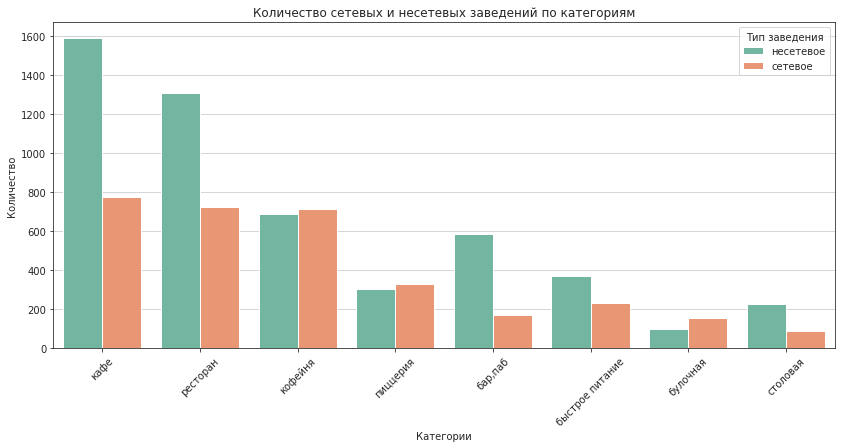

In [31]:
sns.set_style("ticks",{'axes.grid' : True})
plt.figure(figsize = (14,6))
ax = sns.barplot(x='category', y='cnt', data=data, hue='chain', estimator=sum,
                palette='Set2')

ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)
ax.set_title('Количество сетевых и несетевых заведений по категориям')
ax.set_xlabel('Категории')
ax.set_ylabel('Количество')
ax.legend(title='Тип заведения')
plt.show()

Несетевых ресторанов, кафе, баров и столовых почти в два раза больше чем сетевых. Это связано с индивидуальностью заведений. Такие заведения часто сильно зависят от определенных критериев или условий, что трудно было бы поставить на конвеер.
Пиццерий же больше сетевых. Узкий формат специализации, где можно наладить рабочий процесс одинаково везде позволяют сделать упор на несколько заведений.
Такая же ситуация и с булочными и кофейнями.
Что касается ресторанов быстрого питания: довольно много закусочных одиночек, по типу шавермы, поэтому преобладают несетевые заведения.


#### Топ 15 сетевых заведений

In [32]:
data['address'].str.split(', ').apply(lambda x: x[0]).unique()

array(['Москва'], dtype=object)

Все адреса в Москве

In [33]:
top_15_chain=data.query('chain == "сетевое"').groupby(['name','category'])['index'].nunique() \
.sort_values(ascending=False).reset_index().head(15)
top_15_chain=top_15_chain.rename(columns = {'name':'название','index':'количество', 'category':'категория'})
top_15_chain

,название,категория,количество
0,шоколадница,кофейня,117
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,яндекс лавка,ресторан,71
4,one price coffee,кофейня,70
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


Самые популярные сети: Шоколадница (118 заведение), доминос пицца(76 заведение), додо пицца(74 заведение), яндекс лавка (71)  и one price coffe(70 заведение).

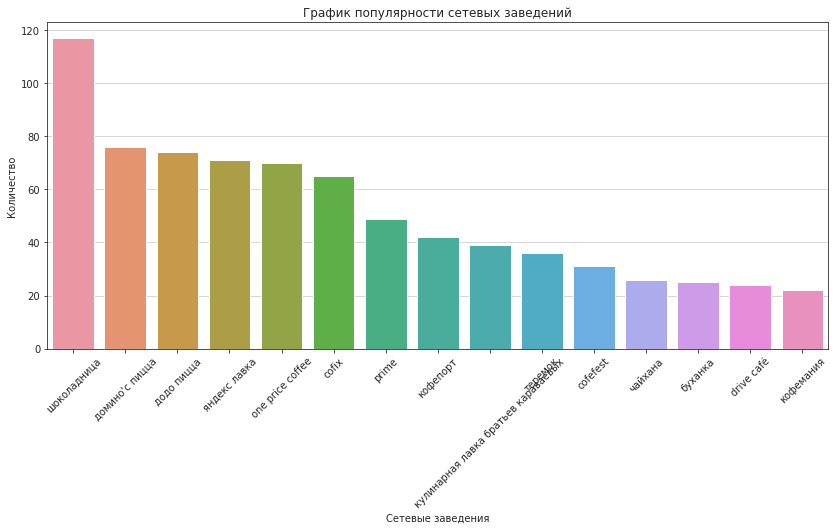

In [34]:
sns.set_style("ticks",{'axes.grid' : True})
plt.figure(figsize = (14,6))
ax = sns.barplot(x='название', y='количество', data=top_15_chain, estimator=sum)

ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)
ax.set_title('График популярности сетевых заведений')
ax.set_xlabel('Сетевые заведения')
ax.set_ylabel('Количество')
plt.show()

Шоколадница абсолютный рекордсмен среди сетевых заведений кафе. Далее идут 2 не менее больших сети конкурента пиццерий додо и доминос. Далее идет яндекс лавка. Также стоит отметить большую сеть кофеен one price coffe и его конкурента coffix. Все эти сети имеют более 60-ти заведений. Остальные из топ 15 имеют около 40 или менее.

In [35]:
fig = px.bar(top_15_chain, x='название', y='количество',
            color='категория')
fig.show()

По категориям можно сказать, что самые большое количество заведений из сетевых у кофеен.

### Данные по районам

#### Распределение заведений по районам

In [36]:
data_renamed=data.copy()
data_renamed['district'] = data_renamed['district'].str.replace('административный округ', '')
#Продублируем таблицу и переименуем столбец для удобства визуализации, сохранив оригинальные данные в data

In [37]:
cnt_cat_distr=data_renamed.groupby(['district','category'])['cnt'].sum()
cnt_cat_distr=cnt_cat_distr.reset_index().sort_values(by='cnt',ascending=False)
cnt_cat_distr

,district,category,cnt
46,Центральный,ресторан,670
43,Центральный,кафе,464
44,Центральный,кофейня,428
40,Центральный,"бар,паб",364
51,Юго-Восточный,кафе,282
...,...,...,...
32,Северо-Западный,"бар,паб",23
39,Северо-Западный,столовая,18
63,Юго-Западный,столовая,17
49,Юго-Восточный,булочная,13


In [38]:
category_cnt_district = data_renamed.pivot_table(index='category', values='cnt',
                                      columns='district',aggfunc='sum').reset_index()
category_cnt_district.columns.name=''
category_cnt_district

,category,Восточный,Западный,Северный,Северо-Восточный,Северо-Западный,Центральный,Юго-Восточный,Юго-Западный,Южный
0,"бар,паб",50,46,68,63,23,364,38,38,68
1,булочная,25,37,39,28,12,50,13,27,25
2,быстрое питание,70,62,58,82,30,87,67,61,85
3,кафе,270,234,235,269,115,464,282,237,264
4,кофейня,104,146,193,159,62,428,89,96,131
5,пиццерия,72,70,77,68,40,113,55,64,73
6,ресторан,160,213,188,182,109,670,145,167,201
7,столовая,40,23,41,40,18,66,25,17,44


#### Распределение по районам по категориям

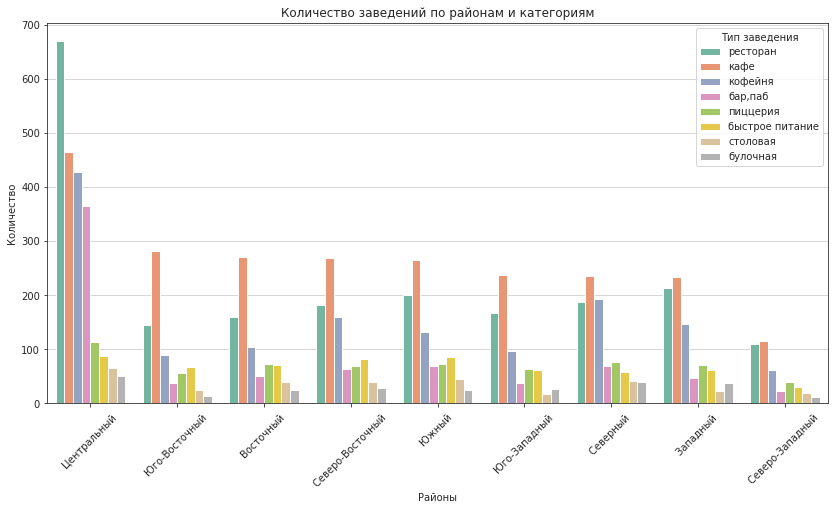

In [39]:
plt.figure(figsize = (14,7))
ax = sns.barplot(x='district', y='cnt', data=cnt_cat_distr, hue='category', estimator=sum,
                palette='Set2')

ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)
ax.set_title('Количество заведений по районам и категориям')
ax.set_xlabel('Районы')
ax.set_ylabel('Количество')
ax.legend(title='Тип заведения')
plt.show()

В распределении по районам видно, что в центральном районе наибольшее количество заведений, в особенности ресторанов, кафе, кофеен и баров.
В остальных районах кафе и ресторанов.
Также большое количество кофеен в северном, северо-восточном, южном и западном районах.

#### Рейтинг заведений

In [40]:
rating=data.pivot_table(index='category',values='rating',aggfunc='mean').sort_values(by='rating',ascending=False).reset_index()
rating=rating.rename(columns = {'category':'название','rating':'рейтинг'})
rating = round(rating,2)

Самые высокие средние оценки у баров, пабов - 4.39, когда самые низкие у заведений быстрого питания - 4.05.

In [41]:
def show_values(axs, orient="v", space=.01):
    def _single(ax):
        if orient == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
                value = '{:.1f}'.format(p.get_height())
                ax.text(_x, _y, value, ha="center") 
        elif orient == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height() - (p.get_height()*0.5)
                value = '{:.1f}'.format(p.get_width())
                ax.text(_x, _y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

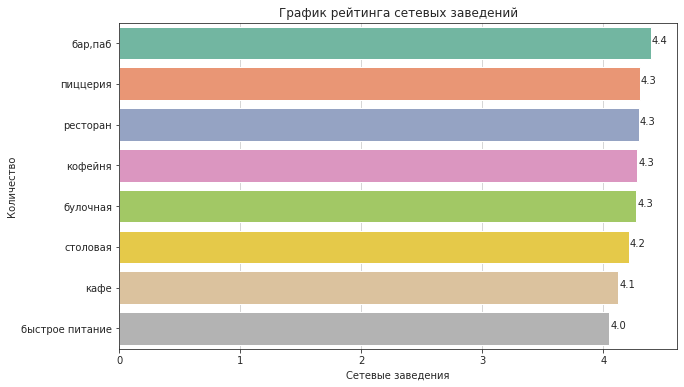

In [42]:

plt.figure(figsize = (10,6))
ax = sns.barplot(x='рейтинг', y='название', data=rating, estimator=sum,
             palette='Set2')

show_values(ax, 'h')

ax.set_title('График рейтинга сетевых заведений')
ax.set_xlabel('Сетевые заведения')
ax.set_ylabel('Количество')

plt.show()

Кроме самых высоких оценок баров, пабов, а самых низких у кафе и заведений быстрого питания можно сказать, что распределение довольно равное.

In [43]:
rating=data.pivot_table(index='district',values='rating',aggfunc='mean') \
.sort_values(by='rating',ascending=False).reset_index()
round(rating,2)

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Южный административный округ,4.18
4,Западный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


Лидер по рейтингу среди районов - Центральный 4.38. Самые низкие оценки у Юго-восточного 4.10.

In [44]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

В центральном районе самые высокие оценки, также на северо-западе Москвы заведения имеют хорошие оценки, когда противоположные районы Юго-восточного направления наоброт.

In [45]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

По маркерам можно сказать, что заведения расположены не равномерно. Большинство находится в центре и западных районах.

### Заключительный общий анализ

#### Топ 15 улиц

In [46]:
top_15_street=data.groupby('street')['index'].nunique() \
.sort_values(ascending=False).reset_index().head(15)
top_15_street=top_15_street.rename(columns = {'street':'название','index':'количество'})
top_15_street

,название,количество
0,проспект Мира,184
1,Профсоюзная улица,122
2,Ленинский проспект,107
3,проспект Вернадского,97
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


Наибольшее количество заведений находится на улицах: проспект Мира- 184, Профсоюзная улица - 122 заведение, Ленинский проспект -107. Это большие, связующие улицы, которые соединяют края Москвы с центром. На них располагается много  университетов, станций метро и тд. Эти улицы с большим потоком транспорта и людей. 

In [47]:
street_category=data.groupby(['street','category'])['cnt'].sum() \
.reset_index().sort_values(by='cnt',ascending=False)
street_category=street_category.rename(columns = {'street':'название','category':'категория','cnt':'количество'})
street_category.head(10)

,название,категория,количество
2859,проспект Мира,кафе,53
2862,проспект Мира,ресторан,45
1379,МКАД,кафе,45
2860,проспект Мира,кофейня,36
1988,Профсоюзная улица,кафе,35
1294,Ленинский проспект,ресторан,33
2847,проспект Вернадского,ресторан,29
1286,Ленинградское шоссе,ресторан,26
1362,Люблинская улица,кафе,26
1291,Ленинский проспект,кафе,26


In [48]:
top_15_street_category=street_category[street_category['название'].isin(top_15_street['название'])]
top_15_street_category=top_15_street_category.rename(columns = {'street':'название','category':'категория','cnt':'количество'})
top_15_street_category.head(10)

,название,категория,количество
2859,проспект Мира,кафе,53
2862,проспект Мира,ресторан,45
1379,МКАД,кафе,45
2860,проспект Мира,кофейня,36
1988,Профсоюзная улица,кафе,35
1294,Ленинский проспект,ресторан,33
2847,проспект Вернадского,ресторан,29
1286,Ленинградское шоссе,ресторан,26
1362,Люблинская улица,кафе,26
1291,Ленинский проспект,кафе,26


По категориям видно,что на этих улицах преобладают рестораны и кафе. При этом на проспекте Мира много кофеен.

In [49]:
fig = px.bar(top_15_street_category,x='количество',y='название',color='категория',
            title='Топ 15 улиц по количеству заведений')

fig.show()

В целом на улицах преобладают рестораны и кафе. Стоит заметить, что на самых больших улицах по количеству заведений много кофеен. Однако большое количество объектов питания на этих улицах можно объяснить их размером.

#### Улицы с одним заведением

In [50]:
data.shape

(8375, 18)

In [51]:
one_place=data.groupby('street')['cnt'].sum().reset_index()
one_place=one_place[one_place['cnt']==1]
one_place

,street,cnt
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


Улиц с одним заведением довольно много - 458

In [52]:
one_place_info=data[data['street'].isin(one_place['street'])]
one_place_info.head()

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,cnt
15,15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,несетевое,180.0,улица Бусиновская Горка,False,1
21,21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,несетевое,NaN,Прибрежный проезд,False,1
25,25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевое,NaN,парк Левобережный,False,1
58,58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,сетевое,NaN,Угличская улица,False,1
60,60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,сетевое,NaN,ландшафтный заказник Лианозовский,False,1


In [53]:
one_place_info.groupby('category')['cnt'].sum().sort_values()

category
булочная             8
пиццерия            15
быстрое питание     23
столовая            36
бар,паб             39
кофейня             84
ресторан            93
кафе               160
Name: cnt, dtype: int64

На улицах, где расположено всего одно заведение больше всего кафе - 160, далее идут рестораны (93) и кофейни (84).

In [54]:
one_place_info.groupby('district')['cnt'].sum().sort_values()


district
Юго-Западный административный округ         18
Северо-Западный административный округ      19
Западный административный округ             35
Юго-Восточный административный округ        39
Южный административный округ                43
Восточный административный округ            52
Северный административный округ             52
Северо-Восточный административный округ     55
Центральный административный округ         145
Name: cnt, dtype: int64

Оснавная доля таких заведений расположена в центральном районе. Скорее всего это связано с отсутствием места на улицах для других заведений, а так же премиальностью заведений.

In [55]:
one_place_info.groupby('chain')['cnt'].sum()

chain
несетевое    325
сетевое      133
Name: cnt, dtype: int64

Несетевых одиночных заведений больше чем в два раза.

In [56]:
one_place_cat_district=one_place_info.groupby(['district',
                                               'category'])['cnt'].sum().reset_index()\
.sort_values(by='cnt',ascending=False)
fig = px.bar(one_place_cat_district,x='cnt',y='district',color='category',
            title='Топ заведений по категориям на одиночных улицах')

fig.show()

Больше всего одиночных заведений - кафе. Однако в некоторых районах довольно много одиночных кафеен или ресторанов.

#### Средний чек

In [57]:
district_price=data.groupby('district')['middle_avg_bill'].median()
district_price.reset_index().sort_values(by='middle_avg_bill',ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Самые большие значения среднего чека в районах: центральный, западный и северо-западный. Это связано с тем, что там расположены наиболее дорогие районы Москвы.

In [58]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_price,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

Стоит отметить, что большие значения среднего чека в районах: центральный и западный, могут быть связаны с зарплатами в этих районах. Например в западном районе расположен деловой центр, с большим количеством офисов.

#### Заканомерности рейтинга

In [59]:
rating_bill=data.groupby(['rating','category'])['middle_avg_bill'].median().reset_index()
min_rating_bill = rating_bill.sort_values(by='rating',ascending=True).head(15)
min_rating_bill

,rating,category,middle_avg_bill
0,1.0,кафе,4500.0
1,1.0,пиццерия,NaN
2,1.0,ресторан,NaN
3,1.0,столовая,NaN
4,1.1,"бар,паб",NaN
5,1.1,быстрое питание,NaN
6,1.1,кафе,NaN
7,1.1,ресторан,NaN
8,1.2,кафе,NaN
13,1.3,ресторан,NaN


Можно заметить, что самый низкий рейтинг получили заведения, где не указан средний чек.

In [60]:
fig = px.bar(rating_bill,x='rating',y='middle_avg_bill',color='category',
            title='Распределение рейтинга по категориям по районам')

fig.show()

По графику можно сказать, что в целом, чем выше значение среднего чека у заведения, тем выше рейтинг. Однако на рейтинге 3 виден скачок. Возможно это говорит о завышении цены или предоставлении услуг не соответствующих цене, поэтому оценка занижена. Также, видно что люди неохотно ставят наивысшую оценку 5. 
Много низких оценок у кафе.

#### Заканомерности часов работы

In [61]:
place_24=data.groupby('district')['is_24/7'].sum().reset_index()
place_all = data.groupby('district')['is_24/7'].count().reset_index()

place_24['percent_24']=place_24['is_24/7']/place_all['is_24/7']*100
round(place_24.sort_values(by='is_24/7',ascending=False),2)

,district,is_24/7,percent_24
5,Центральный административный округ,131,5.84
0,Восточный административный округ,97,12.26
6,Юго-Восточный административный округ,93,13.03
3,Северо-Восточный административный округ,75,8.42
8,Южный административный округ,75,8.42
7,Юго-Западный административный округ,73,10.33
2,Северный административный округ,71,7.90
1,Западный административный округ,70,8.42
4,Северо-Западный административный округ,43,10.51


Больше всего круглосуточных заведений в центре города.

In [62]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=place_24,
    columns=['district', 'is_24/7'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Количество круглосуточных заведений по районам',
).add_to(m)

# выводим карту
m

Лидеры по круглосуточным заведениям центр и северо-восточная части.

In [63]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=place_24,
    columns=['district', 'percent_24'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Соотношение круглосуточных к не круглосуточным заведениям по районам',
).add_to(m)

# выводим карту
m

Из соотношения круглосутчных к некруглосуточным видно что провал в центре Москвы. Не учитывая центр, поскольку там много отдыхающих и круглосуточных заведений, можно сказать, что в ночное время суток большинство людей находится в спальных районах, соответственно такие районы более активны в ночное время суток по соотношению к некруглосуточным заведениям.

In [64]:
place_24_category=data.groupby('category')['is_24/7'].sum().reset_index()
place_24_category.sort_values(by='is_24/7',ascending=False)

,category,is_24/7
3,кафе,267
2,быстрое питание,150
6,ресторан,133
4,кофейня,59
0,"бар,паб",52
5,пиццерия,31
1,булочная,24
7,столовая,12


Больше всего круглосуточных кафе, ресторанов и заведений быстрого питания.

In [65]:
category_price=data.groupby('category')['middle_avg_bill'].median()
category_price.reset_index().sort_values(by='middle_avg_bill',ascending=False)

,category,middle_avg_bill
0,"бар,паб",1250.0
6,ресторан,1250.0
5,пиццерия,600.0
3,кафе,550.0
1,булочная,450.0
4,кофейня,400.0
2,быстрое питание,375.0
7,столовая,300.0


Самые высокие средние чеки в барах и ресторанах.

Больше всего в Москве кафе, их 2378, далее идут рестораны, со значением 2042. Третье место занимают кофейни - 1413. Остальных категорий заметно меньше.
Наибольшее количество посадочных мест в ресторанах, барах и кофейнях (около 100).
Сетевых Сетевых заведений 5182, а несетевых 3193.
Несетевых ресторанов, кафе, баров и столовых почти в два раза больше чем сетевых. Пиццерий, булочных и кофеен больше сетевых. Что касается ресторанов быстрого питания, в них преобладают несетевые заведения.
Самые популярные сети: Шоколадница (118 заведение), доминос пицца(76 заведение), додо пицца(74 заведение), яндекс лавка (71) и one price coffe(70 заведение). По категориям можно сказать, что самые большое количество заведений из сетевых у кофеен.
В распределении по районам видно, что в центральном районе наибольшее количество заведений, в особенности ресторанов, кафе, кофеен и баров. В остальных районах кафе и рестораны. Также большое количество кофеен в северном, северо-восточном, южном и западном районах.
Самые высокие средние оценки у баров, пабов - 4.39, когда самые низкие у заведений быстрого питания - 4.05.
Лидер по рейтингу среди районов - Центральный 4.38. Самые низкие оценки у Юго-восточного 4.10.
Наибольшее количество заведений находится на улицах: проспект Мира- 184, Профсоюзная улица - 122 заведение, Ленинский проспект -107.
Улиц с одним заведением довольно много - 458. На улицах, где расположено всего одно заведение больше всего кафе - 160, далее идут рестораны (93) и кофейни (84). Оснавная доля таких заведений расположена в центральном районе. Несетевых одиночных заведений больше чем в два раза.
Самые большие значения среднего чека в районах: центральный, западный и северо-западный. Это связано с тем, что там расположены наиболее дорогие районы Москвы. 
Больше всего круглосуточных заведений в центре города, кафе, ресторанов и заведений быстрого питания.

## Детализация исследования: открытие кофейни

### Общие количество кофеен и по районам

In [66]:
data_cafe=data.query('category=="кофейня"')

In [67]:
data_cafe['index'].count()

1408

Всего 1408 кофеен в Москве.

In [68]:
cafe_district=data_cafe.groupby('district')['cnt'].sum().sort_values(ascending=False)
cafe_district.reset_index()

,district,cnt
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,146
4,Южный административный округ,131
5,Восточный административный округ,104
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


Больше всего кофеен в центральном административном округе - 428.

In [69]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cafe_district,
    columns=['district', 'cnt'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Распределение кофеен по районам',
).add_to(m)

# выводим карту
m

В центре концентрация кофеен значительно выше, чем в других районах, так же стоит выделить север Москвы.

In [70]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_cafe.apply(create_clusters, axis=1)

# выводим карту
m

По маркерам видно, что основная зависимость в расположении кафеен связана с людским трафиком.

### Круглосуточные кофейни

In [71]:
data_cafe.groupby('is_24/7')['cnt'].sum()

is_24/7
False    1349
True       59
Name: cnt, dtype: int64

Круглосуточных кафеен крайне мало по сравнению с некруглосуточными. 76 круглосуточная и 1332 нет. Это может говорить о неактуальности продукта в ночное время суток.

In [72]:
cafe_24=data_cafe.groupby(['district','is_24/7'])['cnt'].sum().reset_index()
cafe_24

,district,is_24/7,cnt
0,Восточный административный округ,False,99
1,Восточный административный округ,True,5
2,Западный административный округ,False,137
3,Западный административный округ,True,9
4,Северный административный округ,False,188
5,Северный административный округ,True,5
6,Северо-Восточный административный округ,False,156
7,Северо-Восточный административный округ,True,3
8,Северо-Западный административный округ,False,60
9,Северо-Западный административный округ,True,2


In [73]:
fig = px.bar(cafe_24,x='cnt',y='district',color='is_24/7',
            title='Количество 24/7 и не 24/7 кафеен по районам')

fig.show()

Наиболее распространены круглосуточные кофейни в центре. Стоит отметить, что практически нет круглосуточных кофеен в юго-восточном округе.

### Рейтинг кофеен

In [74]:
rating_cafe=data.groupby('district')['rating'].mean().reset_index()
round(rating_cafe,2)

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


Рейтинг по районам примерно равный.

In [75]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cafe,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

Центральный округ лидер по рейтингу кофеен, далее идет северо-западная часть Москвы.

### Средняя стоимость одной чашки кофе

In [76]:
data_cafe['middle_coffee_cup'].describe()

count     520.000000
mean      174.900000
std        89.769012
min        60.000000
25%       124.000000
50%       169.500000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

1568 рублей за чашку довольно много. Проверим на выбросы.

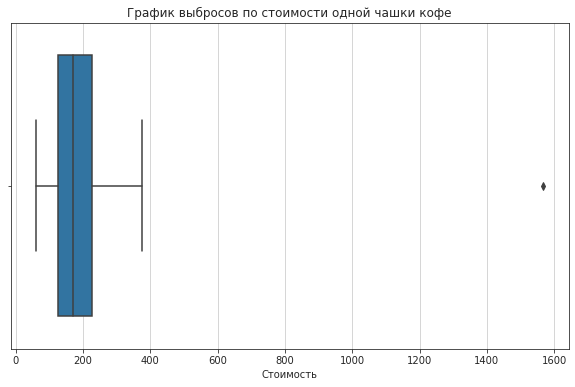

In [77]:
plt.figure(figsize = (10,6))
ax = sns.boxplot(x='middle_coffee_cup', data=data_cafe)

ax.set_title('График выбросов по стоимости одной чашки кофе')
ax.set_xlabel('Стоимость')
plt.show()

Всего одно значение, скорее всего это ошибка. Избавляемся.

In [78]:
data_cafe[data_cafe['middle_coffee_cup']>600]

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,cnt
2858,2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,сетевое,48.0,Большая Семёновская улица,False,1


In [79]:
data_cafe=data_cafe[data_cafe['index']!=2859]

In [80]:
middle_coffe_cup = data_cafe.groupby('district')['middle_coffee_cup'].median().reset_index()
middle_coffe_cup.sort_values(by='middle_coffee_cup',ascending=False)

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,187.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


Самое дорогое кофе в юго-западном административном округе 198р. Далее идет Центральный и западный округа. 190-187р.

In [81]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_coffe_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

Юго-Западное и Центральное направление наиболее перспективное в плане выручки.

### Определение места для кофейни

In [82]:
data_uzao=data_cafe[data_cafe['district']=='Юго-Западный административный округ']

In [83]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_uzao.apply(create_clusters, axis=1)

# выводим карту
m

Стоит присмотреться к Юго-Западному округу, поскольку конкуренция здесь будет не такой большой и цены на чашку кофе здесь самые высокие, что перспективно как для выручки, так и для конкурентноспособности. 
Можно заметить полное отсутсвие кофеен в районе Ленинского проспекта.

In [84]:
# сохраняем координаты выбранного места в переменные
place_lat, place_lng = 55.653587, 37.500448

place_type = 'Рекомендуемое место'

# создаём карту с центром в точке расположения мместа и начальным зумом 17
m = folium.Map(location=[place_lat, place_lng],\
               zoom_start=17)

folium.Marker([place_lat, place_lng],\
              tooltip=place_type,\
              popup='Кофейня')\
              .add_to(m)


# выводим карту
m

Я считаю перспективным около Ленинского проспекта, напротив Университета РУДН.
Тут нет конкурентов и большой поток людей, в особенности студентов, которые будут отдыхать в перерывах от занятий или собираться в конце дня.
В этой точке присутсвует несколько кафе, но тем не менее в своей сфере будет легко завоевать внимание.

## Общий вывод

1. На этапе обзора и загрузки обнаружено: В таблице присутствуют 5614 заведений, 8 категорий и 9 районов.  Обнаружено много пропусков. Это связано с тем, что  информация, могла быть добавлена пользователями или найдена в общедоступных источниках. Мы не можем их заполнить корректно, но и удалить их нельзя т.к. это сильно исказит анализ. Оставим пропуски в таблице. Явных дубликатов необнаружено.
2. На этапе предобработки удалось найти один неявный дубликат в таблице, его убрали. Создан новый столбец с круглосуточной работой заведения и столбец с названием улицы. Столбец с обозначение сетевых мест переименован для удобства.
3. Анализ: 
Больше всего в Москве кафе - 2378, далее идут рестораны - 2042, кофейни - 1413.
Наибольшее количество посадочных мест в ресторанах, барах и кофейнях (около 100).
Сетевых Сетевых заведений 5182, а несетевых 3193.
Несетевых ресторанов, кафе, баров и столовых почти в два раза больше чем сетевых. Пиццерий, булочных и кофеен больше сетевых, ресторанов быстрого питания, больше несетевых.
Самые популярные сети: Шоколадница (118 заведение), доминос пицца(76 заведение), додо пицца(74 заведение), яндекс лавка (71) и one price coffe(70 заведение). По категориям можно сказать, что самые большое количество заведений из сетевых у кофеен.
В распределении по районам видно, что в центральном районе наибольшее количество заведений, в особенности ресторанов, кафе, кофеен и баров. В остальных районах кафе и рестораны. Также большое количество кофеен в северном, северо-восточном, южном и западном районах.
Самые высокие средние оценки у баров, пабов - 4.39, когда самые низкие у заведений быстрого питания - 4.05.
Лидер по рейтингу среди районов - Центральный 4.38. Самые низкие оценки у Юго-восточного 4.10.
Наибольшее количество заведений находится на улицах: проспект Мира- 184, Профсоюзная улица - 122 заведение, Ленинский проспект -107. Это большие, связующие улицы, которые соединяют края Москвы с центром. На них располагается много университетов, станций метро и тд. Эти улицы с большим потоком транспорта и людей.
Улиц с одним заведением довольно много - 458. На улицах, где расположено всего одно заведение больше всего кафе - 160, далее идут рестораны (93) и кофейни (84). Оснавная доля таких заведений расположена в центральном районе. Несетевых одиночных заведений больше чем в два раза.
Самые большие значения среднего чека в районах: центральный, западный и северо-западный. Это связано с тем, что там расположены наиболее дорогие районы Москвы. 
Больше всего круглосуточных заведений в центре города, кафе, ресторанов и заведений быстрого питания.
4. На этапе детолизации установлено: 
Всего 1408 кофеен в Москве. Больше всего кофеен в центральном административном округе - 428. В центре концентрация кофеен значительно выше, чем в других районах, так же стоит выделить север Москвы.
Рейтинг по районам примерно равный, но Центральный округ лидер по рейтингу кофеен.
Самое дорогое кофе в юго-западном административном округе 198р. Далее идет Центральный и западный округа. 190-187р.
На основе анализа, мной было принято присмотреться к Юго-Западному округу, поскольку конкуренция здесь будет не такой большой и цены на чашку кофе здесь самые высокие, что перспективно как для выручки и для конкуренции. Можно заметить полное отсутсвие кофеен в районе Ленинского проспекта. Поэтому я выбрал точку напротив Университета РУДН, где большая проходимость.

## Презентация

Презентация: <https://drive.google.com/file/d/14pEzCN4BL59IMzgnfO1NDDoN0Av4Bre-/view?usp=drive_link> 